In [ ]:
# Install YOLOv8 if not already installed
!pip install ultralytics --upgrade

Please upload your YOLOv8 model (.pt file)


Saving best_yolov8m.pt to best_yolov8m.pt
Uploaded model: best_yolov8m.pt
Model best_yolov8m.pt loaded successfully
Please upload an image to predict


Saving IMG_4371.jpg to IMG_4371.jpg
Uploaded image: IMG_4371.jpg

image 1/1 /content/IMG_4371.jpg: 640x480 2 Weedss, 1398.6ms
Speed: 6.9ms preprocess, 1398.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs/detect/predict
Prediction complete


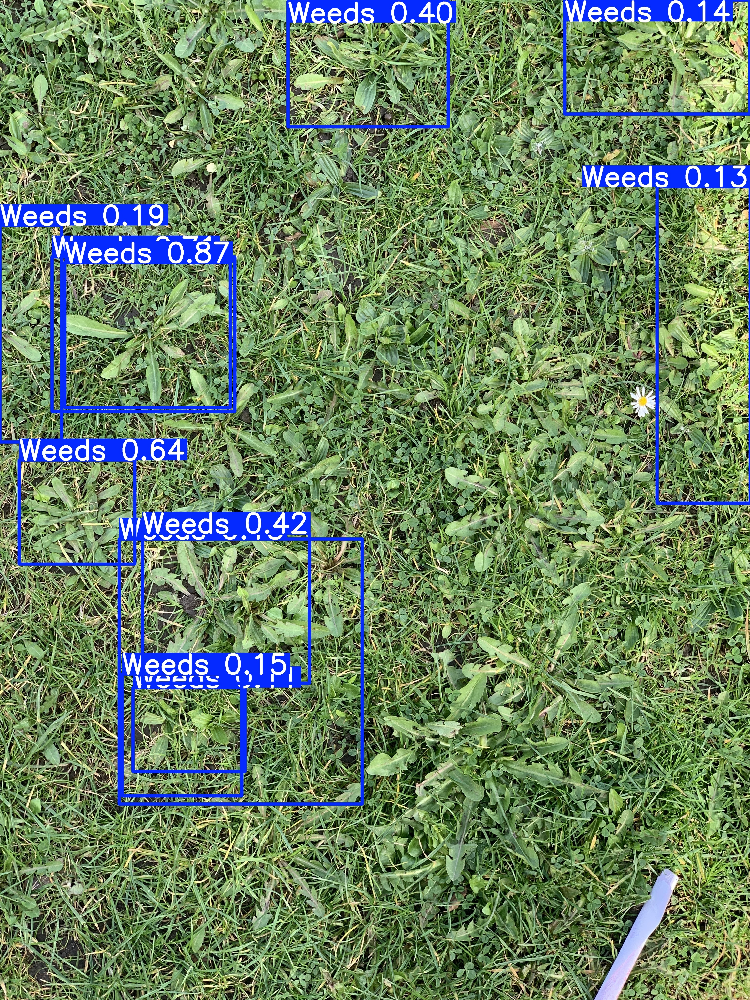

In [ ]:

from ultralytics import YOLO
from google.colab import files
from IPython.display import Image, display
import os
import glob


print("Please upload your YOLOv8 model (.pt file)")
uploaded = files.upload()

model_filename = list(uploaded.keys())[0]
print(f"Uploaded model: {model_filename}")

#Load the model
model = YOLO(model_filename)
print(f"Model {model_filename} loaded successfully")

#Upload an image for prediction
print("Please upload an image to predict")
uploaded_image = files.upload()

image_filename = list(uploaded_image.keys())[0]
print(f"Uploaded image: {image_filename}")

#Run prediction
results = model.predict(image_filename, save=True, imgsz=640)
print("Prediction complete")

pred_folder = results[0].save_dir


predicted_images = glob.glob(os.path.join(pred_folder, '*.jpg')) + glob.glob(os.path.join(pred_folder, '*.jpeg')) + glob.glob(os.path.join(pred_folder, '*.png'))


if len(predicted_images) > 0:
    pred_image_path = predicted_images[0]  # take first detected image
    display(Image(filename=pred_image_path))
else:
    print("No predicted images found.")
